# Установка библиотек

In [1]:
# Ignore FutureWarning
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


In [2]:
!pip install plotly

In [3]:
!pip install plotly scanpy

In [4]:
import plotly.io as pio
pio.renderers.default='notebook'

In [5]:
import pandas as pd
import numpy as np
import os
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.stats import spearmanr
import seaborn as sns
import scanpy as sc
import matplotlib.pyplot as plt
import plotly.express as px

для подключения контента с гугл диска

In [6]:
import os ,sys
from google.colab import drive
drive.mount('/content/drive')
os.listdir('/content/drive')
directory_path = '/content/drive/MyDrive/bioinf_inst/omics_aging/CpG'
print(os.listdir(directory_path))
sys.path.append(directory_path)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
['join_annot.ipynb', 'OmicDownlload (1).ipynb', 'filterd_CpG_leiko_corrected_12032024.csv', 'metaannot.csv', 'data', 'Clustering_results.ipynb', 'one_dataset_pipeline.ipynb', 'prefinal_pres.pptx']


# Делаем фильтрацию тех остравоков, которые не изменили свою экспрессию

In [31]:
df = pd.read_csv(os.path.join(directory_path, 'filterd_CpG_leiko_corrected_12032024.csv'))
df = df.drop_duplicates().set_index('index')
df.head()

,cg00008647,cg00295572,cg00346208,cg00448707,cg00563824,cg00664416,cg00764612,cg00908766,cg00951395,cg01101873,...,cg18855195,cg19543968,cg19558972,cg19713460,cg19800640,cg19855470,cg21401457,cg21445911,cg24435209,cg26169700
index,,,,,,,,,,,,,,,,,,,,,
GSM1051525,0.224142,0.167473,0.252797,0.767779,0.292238,0.289371,0.375905,0.522142,0.411905,0.453685,...,0.557377,0.395075,0.243713,0.249575,0.858602,0.268208,0.602051,0.855962,0.592358,0.825162
GSM1051526,0.219361,0.156888,0.173419,0.753855,0.321734,0.314705,0.330767,0.625400,0.466970,0.561958,...,0.591798,0.400635,0.257338,0.242520,0.851584,0.264483,0.510362,0.852624,0.594299,0.880614
GSM1051527,0.137153,0.060801,0.135405,0.832557,0.106155,0.186398,0.252518,0.531337,0.466123,0.528114,...,0.395909,0.318659,0.196490,0.121846,0.886259,0.215812,0.690511,0.837179,0.656277,0.894600
GSM1051528,0.191287,0.153258,0.181326,0.805664,0.255982,0.281080,0.345738,0.499670,0.384548,0.516283,...,0.440596,0.427026,0.256310,0.227496,0.886949,0.279397,0.573916,0.845085,0.540028,0.885426
GSM1051529,0.210777,0.127497,0.139660,0.689237,0.288889,0.233415,0.346164,0.710315,0.474954,0.559628,...,0.483105,0.372686,0.292122,0.243244,0.871077,0.260122,0.555962,0.493836,0.540540,0.859882


In [32]:
df_all_annot = pd.read_csv(os.path.join(directory_path, 'data/metaannot.csv'))
df_all_annot = df_all_annot.drop_duplicates().set_index('GSM')
df_all_annot.head()

,cell type,disease state,subject,age,gender,smoking status,cohort,cohort_type,age at menarche,cancer type (icd-10),...,rs718314,rs7481311,rs7498665,rs7647305,rs7832552,rs824931,rs887912,rs984222,rs9939609,family
GSM,,,,,,,,,,,,,,,,,,,,,
GSM1051525,PBL,rheumatoid arthritis,Patient,67.0,f,current,GSE42861_annot.csv,leiko,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GSM1051526,PBL,rheumatoid arthritis,Patient,49.0,f,current,GSE42861_annot.csv,leiko,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GSM1051527,PBL,rheumatoid arthritis,Patient,53.0,f,ex,GSE42861_annot.csv,leiko,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GSM1051528,PBL,rheumatoid arthritis,Patient,62.0,f,current,GSE42861_annot.csv,leiko,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GSM1051529,PBL,rheumatoid arthritis,Patient,33.0,f,never,GSE42861_annot.csv,leiko,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


 Строим один тестовый островок

In [15]:
df['cg00295572']

index
GSM1051525    0.167473
GSM1051526    0.156888
GSM1051527    0.060801
GSM1051528    0.153258
GSM1051529    0.127497
                ...   
GSM1236374    0.139527
GSM1236375    0.137195
GSM1236376    0.127772
GSM1236377    0.097703
GSM1236378    0.153500
Name: cg00295572, Length: 1212, dtype: float64

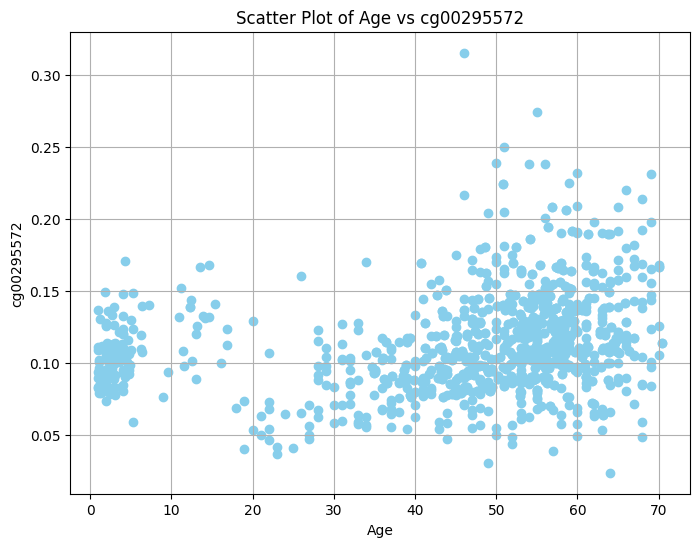

In [ ]:
subdf = df_all_annot[['age']].join(df['cg00295572'])
# Plot scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(subdf['age'], subdf['cg00295572'], color='skyblue')
plt.title('Scatter Plot of Age vs cg00295572')
plt.xlabel('Age')
plt.ylabel('cg00295572')
plt.grid(True)
plt.show()

# Choose one dataframe

In [109]:
df_all_annot['cohort'].unique()

array(['GSE42861_annot.csv', 'GSE51032_annot.csv', 'GSE51057_annot.csv',
       'GSE69270_annot.csv', 'GSE36054_annot.csv', 'GSE64495_annot.csv',
       'GSE30870_annot.csv', 'GSE41169_annot.csv', 'GSE73103_annot.csv',
       'GSE52588_annot.csv'], dtype=object)

In [120]:
cohort_name = 'GSE42861_annot.csv'

In [122]:
subdf_annot = df_all_annot[df_all_annot['cohort']==cohort_name]
subdf_idx = subdf_annot.index
subdf = df.loc[subdf_idx]#.drop_duplicates()

In [123]:
subdf_annot.shape

(687, 95)

In [124]:
subdf_annot.reset_index().drop_duplicates()

,GSM,cell type,disease state,subject,age,gender,smoking status,cohort,cohort_type,age at menarche,...,rs718314,rs7481311,rs7498665,rs7647305,rs7832552,rs824931,rs887912,rs984222,rs9939609,family
0,GSM1051525,PBL,rheumatoid arthritis,Patient,67.0,f,current,GSE42861_annot.csv,leiko,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,GSM1051526,PBL,rheumatoid arthritis,Patient,49.0,f,current,GSE42861_annot.csv,leiko,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,GSM1051527,PBL,rheumatoid arthritis,Patient,53.0,f,ex,GSE42861_annot.csv,leiko,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,GSM1051528,PBL,rheumatoid arthritis,Patient,62.0,f,current,GSE42861_annot.csv,leiko,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,GSM1051529,PBL,rheumatoid arthritis,Patient,33.0,f,never,GSE42861_annot.csv,leiko,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
682,GSM1052209,PBL,Normal,Normal,63.0,f,ex,GSE42861_annot.csv,leiko,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
683,GSM1052210,PBL,Normal,Normal,63.0,f,never,GSE42861_annot.csv,leiko,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
684,GSM1052211,PBL,Normal,Normal,46.0,f,never,GSE42861_annot.csv,leiko,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
685,GSM1052212,PBL,Normal,Normal,64.0,f,ex,GSE42861_annot.csv,leiko,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [125]:
subdf.shape

(687, 4457)

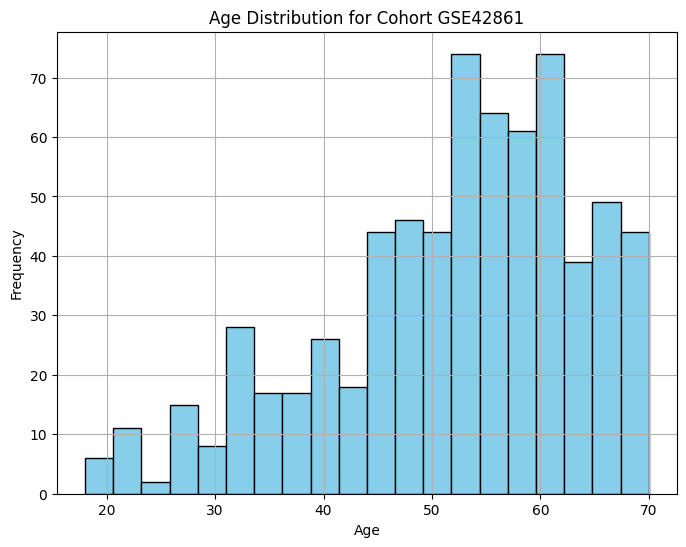

In [126]:
# Plot age distribution for the current cohort
plt.figure(figsize=(8, 6))
plt.hist(subdf_annot['age'], bins=20, color='skyblue', edgecolor='black')
plt.title(f'Age Distribution for Cohort {cohort_name[:-10]}')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [127]:
subdf_idx

Index(['GSM1051525', 'GSM1051526', 'GSM1051527', 'GSM1051528', 'GSM1051529',
       'GSM1051530', 'GSM1051531', 'GSM1051532', 'GSM1051533', 'GSM1051534',
       ...
       'GSM1052204', 'GSM1052205', 'GSM1052206', 'GSM1052207', 'GSM1052208',
       'GSM1052209', 'GSM1052210', 'GSM1052211', 'GSM1052212', 'GSM1052213'],
      dtype='object', name='GSM', length=687)

In [128]:
subdf


,cg00008647,cg00295572,cg00346208,cg00448707,cg00563824,cg00664416,cg00764612,cg00908766,cg00951395,cg01101873,...,cg19543968,cg19558972,cg19713460,cg19800640,cg19855470,cg21401457,cg21445911,cg24435209,cg26169700,age
GSM,,,,,,,,,,,,,,,,,,,,,
GSM1051525,0.224142,0.167473,0.252797,0.767779,0.292238,0.289371,0.375905,0.522142,0.411905,0.453685,...,0.395075,0.243713,0.249575,0.858602,0.268208,0.602051,0.855962,0.592358,0.825162,67.0
GSM1051526,0.219361,0.156888,0.173419,0.753855,0.321734,0.314705,0.330767,0.625400,0.466970,0.561958,...,0.400635,0.257338,0.242520,0.851584,0.264483,0.510362,0.852624,0.594299,0.880614,49.0
GSM1051527,0.137153,0.060801,0.135405,0.832557,0.106155,0.186398,0.252518,0.531337,0.466123,0.528114,...,0.318659,0.196490,0.121846,0.886259,0.215812,0.690511,0.837179,0.656277,0.894600,53.0
GSM1051528,0.191287,0.153258,0.181326,0.805664,0.255982,0.281080,0.345738,0.499670,0.384548,0.516283,...,0.427026,0.256310,0.227496,0.886949,0.279397,0.573916,0.845085,0.540028,0.885426,62.0
GSM1051529,0.210777,0.127497,0.139660,0.689237,0.288889,0.233415,0.346164,0.710315,0.474954,0.559628,...,0.372686,0.292122,0.243244,0.871077,0.260122,0.555962,0.493836,0.540540,0.859882,33.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GSM1052209,0.196253,0.109052,0.166435,0.677873,0.263343,0.260320,0.377650,0.708952,0.352601,0.479325,...,0.336245,0.259160,0.270883,0.847848,0.280030,0.553248,0.815169,0.493919,0.834708,63.0
GSM1052210,0.184801,0.031317,0.049061,0.616858,0.114680,0.197512,0.231165,0.594308,0.463402,0.651279,...,0.340782,0.314015,0.124320,0.885653,0.172468,0.210951,0.874772,0.663732,0.508883,63.0
GSM1052211,0.194609,0.179559,0.219951,0.715996,0.280194,0.308385,0.387242,0.590796,0.400345,0.510847,...,0.358716,0.261441,0.241423,0.819663,0.264484,0.623068,0.834718,0.644287,0.860619,46.0


In [ ]:
subdf_idx

Index(['GSM1051525', 'GSM1051526', 'GSM1051527', 'GSM1051528', 'GSM1051529',
       'GSM1051530', 'GSM1051531', 'GSM1051532', 'GSM1051533', 'GSM1051534',
       ...
       'GSM1052186', 'GSM1052188', 'GSM1052189', 'GSM1052190', 'GSM1052198',
       'GSM1052203', 'GSM1052204', 'GSM1052205', 'GSM1052206', 'GSM1052209'],
      dtype='object', name='GSM', length=381)

In [129]:
idx_in_df = list(df.index)
dupls_in_df = list(set(n for n in idx_in_df if idx_in_df.count(n) > 1))
subdf.loc[dupls_in_df]

KeyError: "None of [Index(['GSM1235547', 'GSM1235660', 'GSM1235782', 'GSM1235988', 'GSM1235830',\n       'GSM1236032', 'GSM1235612', 'GSM1236054', 'GSM1236195', 'GSM1235544',\n       ...\n       'GSM1235817', 'GSM1235941', 'GSM1235876', 'GSM1235561', 'GSM1236045',\n       'GSM1236367', 'GSM1235953', 'GSM1235752', 'GSM1236369', 'GSM1236330'],\n      dtype='object', name='GSM', length=331)] are in the [index]"

In [130]:
subdf_idx = subdf_idx.drop(dupls_in_df)
subdf_annot = subdf_annot.loc[subdf_idx]
subdf = subdf.loc[subdf_idx]
len(subdf) == len(subdf_annot)

KeyError: "['GSM1235547', 'GSM1235660', 'GSM1235782', 'GSM1235988', 'GSM1235830', 'GSM1236032', 'GSM1235612', 'GSM1236054', 'GSM1236195', 'GSM1235544', 'GSM1235551', 'GSM1235789', 'GSM1236115', 'GSM1236211', 'GSM1235740', 'GSM1235574', 'GSM1236152', 'GSM1235572', 'GSM1235552', 'GSM1235667', 'GSM1235571', 'GSM1235818', 'GSM1235624', 'GSM1235586', 'GSM1235565', 'GSM1235573', 'GSM1236192', 'GSM1235605', 'GSM1235929', 'GSM1235940', 'GSM1235545', 'GSM1235819', 'GSM1236065', 'GSM1235930', 'GSM1235925', 'GSM1236212', 'GSM1235672', 'GSM1236360', 'GSM1235640', 'GSM1235606', 'GSM1235757', 'GSM1235541', 'GSM1235560', 'GSM1236278', 'GSM1235542', 'GSM1236119', 'GSM1235831', 'GSM1236280', 'GSM1235563', 'GSM1235838', 'GSM1235901', 'GSM1235891', 'GSM1236378', 'GSM1235654', 'GSM1236332', 'GSM1235550', 'GSM1235934', 'GSM1235694', 'GSM1236067', 'GSM1235742', 'GSM1235619', 'GSM1236237', 'GSM1236131', 'GSM1235620', 'GSM1235809', 'GSM1235873', 'GSM1235760', 'GSM1236363', 'GSM1235790', 'GSM1235657', 'GSM1236221', 'GSM1236368', 'GSM1236365', 'GSM1235562', 'GSM1235631', 'GSM1236348', 'GSM1235539', 'GSM1236295', 'GSM1236151', 'GSM1236048', 'GSM1235821', 'GSM1236292', 'GSM1235644', 'GSM1235870', 'GSM1235607', 'GSM1235886', 'GSM1235556', 'GSM1236336', 'GSM1235677', 'GSM1235987', 'GSM1235852', 'GSM1235643', 'GSM1236374', 'GSM1236196', 'GSM1236162', 'GSM1236286', 'GSM1235600', 'GSM1235581', 'GSM1235911', 'GSM1236252', 'GSM1235655', 'GSM1235836', 'GSM1236240', 'GSM1235787', 'GSM1235793', 'GSM1236053', 'GSM1236093', 'GSM1236372', 'GSM1236294', 'GSM1235721', 'GSM1236373', 'GSM1236352', 'GSM1236049', 'GSM1236009', 'GSM1051754', 'GSM1235811', 'GSM1235646', 'GSM1235611', 'GSM1235683', 'GSM1235570', 'GSM1235546', 'GSM1236029', 'GSM1236057', 'GSM1235538', 'GSM1051984', 'GSM1235638', 'GSM1235984', 'GSM1235978', 'GSM1236043', 'GSM1235679', 'GSM1235535', 'GSM1235664', 'GSM1236376', 'GSM1235559', 'GSM1235935', 'GSM1235549', 'GSM1235908', 'GSM1235815', 'GSM1236179', 'GSM1235582', 'GSM1236362', 'GSM1235883', 'GSM1235994', 'GSM1235543', 'GSM1236227', 'GSM1235548', 'GSM1235871', 'GSM1236267', 'GSM1236283', 'GSM1235806', 'GSM1236287', 'GSM1236268', 'GSM1235625', 'GSM1236205', 'GSM1235950', 'GSM1236167', 'GSM1235875', 'GSM1235979', 'GSM1235706', 'GSM1235569', 'GSM1236003', 'GSM1235641', 'GSM1236204', 'GSM1235557', 'GSM1235590', 'GSM1236216', 'GSM1236062', 'GSM1235649', 'GSM1235850', 'GSM1236052', 'GSM1236358', 'GSM1236349', 'GSM1236272', 'GSM1235583', 'GSM1236018', 'GSM1235949', 'GSM1235784', 'GSM1236370', 'GSM1236209', 'GSM1236357', 'GSM1235926', 'GSM1236046', 'GSM1236047', 'GSM1235826', 'GSM1236075', 'GSM1235558', 'GSM1235632', 'GSM1235897', 'GSM1235781', 'GSM1235576', 'GSM1235591', 'GSM1236243', 'GSM1236377', 'GSM1235874', 'GSM1235568', 'GSM1235555', 'GSM1235704', 'GSM1235730', 'GSM1236208', 'GSM1236230', 'GSM1235617', 'GSM1236296', 'GSM1235537', 'GSM1235707', 'GSM1236136', 'GSM1236039', 'GSM1236086', 'GSM1236347', 'GSM1235711', 'GSM1236142', 'GSM1236100', 'GSM1235596', 'GSM1235939', 'GSM1235824', 'GSM1236262', 'GSM1236366', 'GSM1236173', 'GSM1236356', 'GSM1235904', 'GSM1236171', 'GSM1235578', 'GSM1235621', 'GSM1236359', 'GSM1236310', 'GSM1235936', 'GSM1236201', 'GSM1236025', 'GSM1235955', 'GSM1236110', 'GSM1235887', 'GSM1236199', 'GSM1235727', 'GSM1236109', 'GSM1236364', 'GSM1235577', 'GSM1236371', 'GSM1236219', 'GSM1235962', 'GSM1236253', 'GSM1235922', 'GSM1236147', 'GSM1236006', 'GSM1236180', 'GSM1235579', 'GSM1236291', 'GSM1235588', 'GSM1235575', 'GSM1235628', 'GSM1236137', 'GSM1236150', 'GSM1235589', 'GSM1236112', 'GSM1236285', 'GSM1236312', 'GSM1236135', 'GSM1235567', 'GSM1236084', 'GSM1235829', 'GSM1235670', 'GSM1235534', 'GSM1236215', 'GSM1235816', 'GSM1236001', 'GSM1235812', 'GSM1235637', 'GSM1236345', 'GSM1235813', 'GSM1235659', 'GSM1235601', 'GSM1236265', 'GSM1235553', 'GSM1236340', 'GSM1236113', 'GSM1235661', 'GSM1235566', 'GSM1236206', 'GSM1235786', 'GSM1236005', 'GSM1235584', 'GSM1236107', 'GSM1236013', 'GSM1235804', 'GSM1236231', 'GSM1235594', 'GSM1235564', 'GSM1235554', 'GSM1236224', 'GSM1235708', 'GSM1235947', 'GSM1235536', 'GSM1235866', 'GSM1236375', 'GSM1235703', 'GSM1235580', 'GSM1235540', 'GSM1236160', 'GSM1236074', 'GSM1235915', 'GSM1236343', 'GSM1236186', 'GSM1236214', 'GSM1235604', 'GSM1235585', 'GSM1236213', 'GSM1235756', 'GSM1235966', 'GSM1236317', 'GSM1235963', 'GSM1236251', 'GSM1235587', 'GSM1235680', 'GSM1236004', 'GSM1235858', 'GSM1236016', 'GSM1236064', 'GSM1235973', 'GSM1235764', 'GSM1236218', 'GSM1236361', 'GSM1235714', 'GSM1235723', 'GSM1235817', 'GSM1235941', 'GSM1235876', 'GSM1235561', 'GSM1236045', 'GSM1236367', 'GSM1235953', 'GSM1235752', 'GSM1236369', 'GSM1236330'] not found in axis"

In [131]:
len(subdf) == len(subdf_annot)


True

# Make dataset with ages and mean values calculated as distribution peak
(kinda mode)

And this mode are calculcated as sliding window across 3 years

In [44]:
import pandas as pd
import numpy as np
from scipy.signal import find_peaks
from concurrent.futures import ProcessPoolExecutor

In [132]:
subdf.columns

Index(['cg00008647', 'cg00295572', 'cg00346208', 'cg00448707', 'cg00563824',
       'cg00664416', 'cg00764612', 'cg00908766', 'cg00951395', 'cg01101873',
       ...
       'cg19543968', 'cg19558972', 'cg19713460', 'cg19800640', 'cg19855470',
       'cg21401457', 'cg21445911', 'cg24435209', 'cg26169700', 'age'],
      dtype='object', length=4457)

In [133]:
subdf = subdf.join(subdf_annot['age'])
subdf.columns

ValueError: columns overlap but no suffix specified: Index(['age'], dtype='object')

In [134]:
# Function to compute peak values for a single CpG site
def compute_peak_values(cpg_site):
    peak_values = []
    for age in subdf['age'].unique():
        subset = subdf[subdf['age'] == age][cpg_site]
        density, bins = np.histogram(subset, bins=30, density=True)
        peaks, _ = find_peaks(density, height=0)
        if len(peaks) > 0:
            peak_values.append(bins[peaks[0]])
        else:
            peak_values.append(np.nan)
    return peak_values

In [135]:
%%time


# Create an instance of ProcessPoolExecutor
with ProcessPoolExecutor(max_workers=4) as executor:
    # Submit tasks for each CpG site
    futures = [executor.submit(compute_peak_values, cpg_site) for cpg_site in subdf.columns[:-1]]

    # Retrieve results
    peak_values_all_cpg = [future.result() for future in futures]

# Convert the list of lists to a DataFrame
peak_values_df = pd.DataFrame(peak_values_all_cpg, index=subdf.columns[:-1], columns=subdf['age'].unique()).T

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning:

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



KeyboardInterrupt: 

In [136]:
peak_values_df.head()

,cg00008647,cg00295572,cg00346208,cg00448707,cg00563824,cg00664416,cg00764612,cg00908766,cg00951395,cg01101873,...,cg18855195,cg19543968,cg19558972,cg19713460,cg19800640,cg19855470,cg21401457,cg21445911,cg24435209,cg26169700
1,0.108154,0.089437,0.147150,0.710120,0.151313,0.212086,0.267615,0.628234,0.320082,0.531295,...,0.452649,0.372807,0.251165,0.162933,0.882422,0.213480,0.546229,0.841378,0.557274,0.834416
1,0.143779,0.083461,0.133684,0.698195,0.177996,0.211499,0.262981,0.552602,0.326544,0.539185,...,0.452590,0.362316,0.253695,0.158679,0.662127,0.221272,0.544482,0.851175,0.505684,0.832397
1,0.119253,0.054882,0.149779,0.724379,0.222509,0.219996,0.271514,0.727437,0.392743,0.522625,...,0.464880,0.361293,0.345555,0.204217,0.888022,0.223934,0.634218,0.846366,0.579635,0.857421
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.126026,0.088067,NaN,NaN,0.175938,0.252062,0.273072,0.613185,0.373505,NaN,...,0.456687,0.361849,0.319683,0.179751,NaN,0.222645,NaN,0.846455,0.556692,0.833314


In [ ]:
peak_values_df.to_csv(f'{cohort_name[:9]}peak_values.csv')

# Make different clusterization

In [137]:
# peak_df = peak_values_df
#or
peak_df = pd.read_csv(f'{cohort_name[:9]}peak_values.csv', index_col=0)

In [10]:
from sklearn.neighbors import KNeighborsClassifier

In [11]:
from numpy import unique
from numpy import where
from sklearn.datasets import make_classification
from sklearn.cluster import KMeans
from matplotlib import pyplot

In [12]:
from sklearn.cluster import DBSCAN

In [13]:
from sklearn.mixture import GaussianMixture

In [14]:
from scipy.cluster import hierarchy

### for visualization

In [15]:
import umap.umap_ as umap
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

In [138]:
x_for_pca = peak_df.T.fillna(0)
pca = PCA(n_components=2)
components = pca.fit_transform(x_for_pca)
print(pca.explained_variance_ratio_)
print(pca.singular_values_)

[0.87454639 0.01743021]
[87.88253659 12.40687641]


In [139]:
components_df = pd.DataFrame(components, columns=['x', 'y'])

In [60]:
def plot_umap_and_tsne(labels, x=x_for_pca):
    umap_embedding = umap.UMAP(n_neighbors=15, min_dist=0.1, metric='euclidean').fit_transform(x)
    tsne_embedding = TSNE(n_components=2, perplexity=30, metric='euclidean').fit_transform(x)
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.scatter(umap_embedding[:, 0], umap_embedding[:, 1], c=labels, cmap='viridis', s=10)
    plt.title('UMAP Visualization')

    plt.subplot(1, 2, 2)
    plt.scatter(tsne_embedding[:, 0], tsne_embedding[:, 1], c=labels, cmap='viridis', s=10)
    plt.title('t-SNE Visualization')

    plt.show()

In [61]:
def plot_pca(labels, components_df=components_df):
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=components_df, x='x', y='y', hue=labels, palette='viridis')


In [ ]:
def calculate_clusters_statistics(df, labels):
    df = df.T
    df['clusters'] = labels
    stats = pd.DataFrame()
    stats['mean'] = df.groupby(['cluster_kmeans']).mean().T.mean()
    stats['std'] = df.groupby(['cluster_kmeans']).std().T.mean()

## Looking for correlated CpGs

In [140]:
%%time
corr_matrix = peak_df.corr()

CPU times: user 5.06 s, sys: 89.2 ms, total: 5.15 s
Wall time: 21 s


In [141]:
corr_matrix.head()

,cg00008647,cg00295572,cg00346208,cg00448707,cg00563824,cg00664416,cg00764612,cg00908766,cg00951395,cg01101873,...,cg18855195,cg19543968,cg19558972,cg19713460,cg19800640,cg19855470,cg21401457,cg21445911,cg24435209,cg26169700
cg00008647,1.000000,0.394372,0.256660,0.138167,0.521724,0.505061,0.478496,0.316168,0.200025,0.307008,...,0.260822,0.260993,0.608362,0.628701,0.086227,0.316031,0.046080,0.112096,0.329238,0.159702
cg00295572,0.394372,1.000000,0.489247,-0.098632,0.264485,0.268088,0.447683,-0.137637,0.054799,-0.317326,...,-0.279177,-0.264192,0.281575,0.258668,0.122421,0.351561,-0.322668,-0.141505,-0.226298,-0.232346
cg00346208,0.256660,0.489247,1.000000,-0.155437,0.316347,0.262879,0.514100,-0.342002,0.101643,-0.272644,...,-0.264295,-0.384431,0.242163,0.379979,0.005198,0.516409,-0.149725,-0.111793,-0.240564,-0.268031
cg00448707,0.138167,-0.098632,-0.155437,1.000000,0.100471,0.136855,-0.086258,0.183938,0.084618,0.355135,...,0.387740,0.185805,0.142643,0.088995,0.122297,0.027666,0.295079,0.104383,0.244023,0.248431
cg00563824,0.521724,0.264485,0.316347,0.100471,1.000000,0.484440,0.264082,0.318017,0.147758,0.206282,...,0.274987,0.151373,0.384243,0.447868,0.176062,0.164780,0.189716,0.004150,0.199911,0.163719


In [46]:
# plt.figure(figsize=(30, 20))
# s = sns.clustermap(corr_matrix, annot=False, cmap='coolwarm',vmin=0,vmax=1,)
# plt.show()


## k means

In [102]:
%%time
km_scores= []
# km_silhouette = []
# vmeasure_score =[]
# db_score = []
# scaler = StandardScaler()
# x_s = scaler.fit_transform(corr_matrix)

for i in range(2,15):
    km = KMeans(n_clusters=i, random_state=0).fit(corr_matrix);
    preds = km.predict(corr_matrix);
    km_scores.append(-km.score(corr_matrix))

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

CPU times: user 8min 1s, sys: 14.2 s, total: 8min 15s
Wall time: 4min 54s


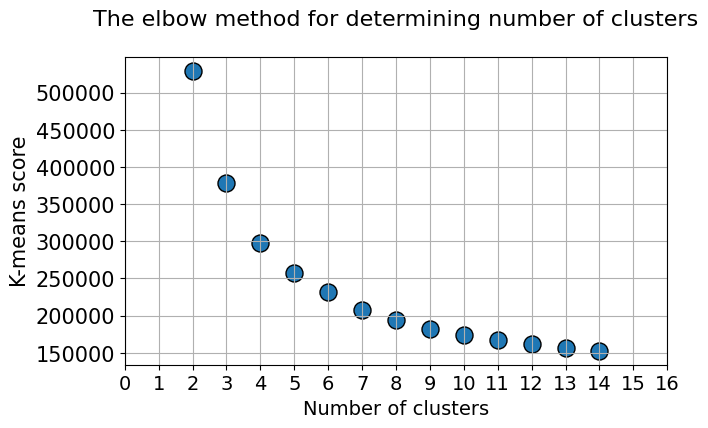

In [106]:
plt.figure(figsize=(7,4))
plt.title("The elbow method for determining number of clusters\n",fontsize=16)
plt.scatter(x=[i for i in range(2,15)],y=km_scores,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Number of clusters",fontsize=14)
plt.ylabel("K-means score",fontsize=15)
plt.xticks([i for i in range(0,17)],fontsize=14)
plt.yticks(fontsize=15)
plt.show();

In [47]:
%%time
kmeans = KMeans(n_clusters=8, random_state=0, n_init="auto").fit(corr_matrix)
kmeans.labels_

CPU times: user 3.94 s, sys: 279 ms, total: 4.22 s
Wall time: 4.34 s


array([5, 0, 0, ..., 3, 1, 1], dtype=int32)

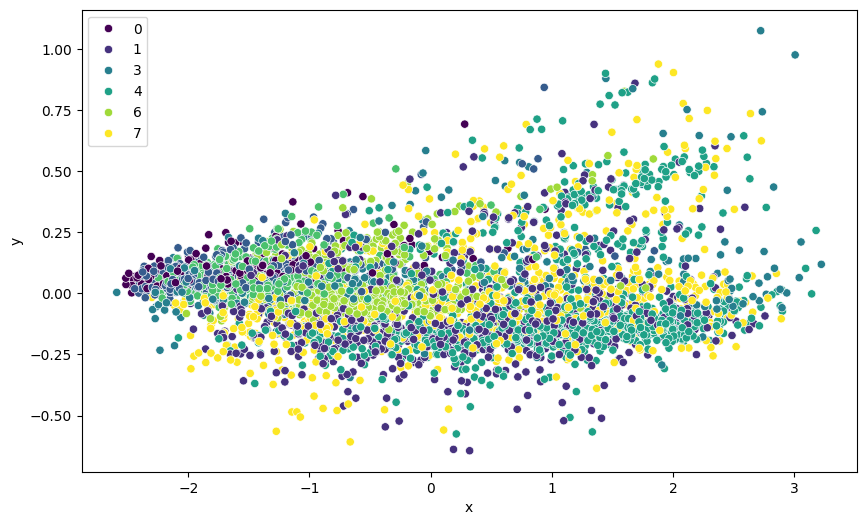

In [48]:
plot_pca(kmeans.labels_)

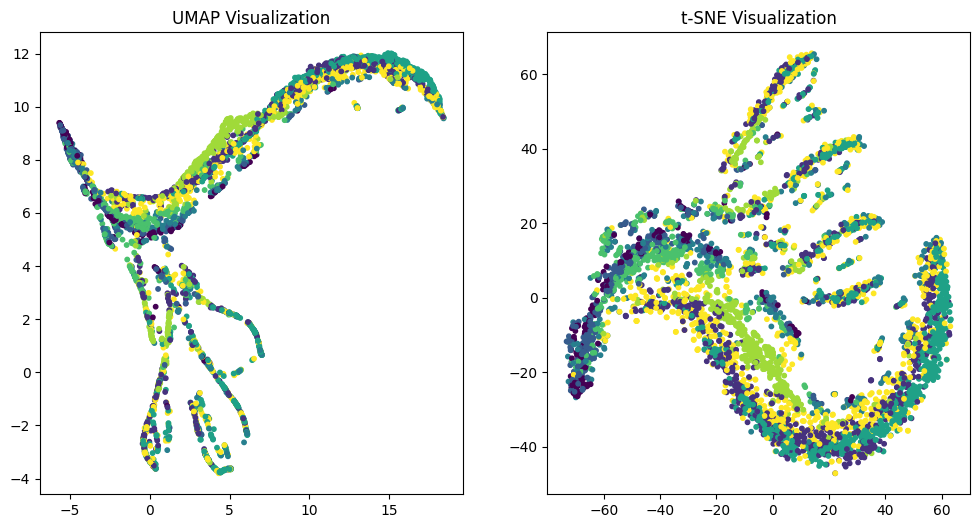

In [49]:
plot_umap_and_tsne(kmeans.labels_)

## hierarchical clustering

In [50]:
def cut_clustermap_tree(g, n_clusters=2, by_cols=True, name='Clusters'):
    """
    Cut clustermap into desired number of clusters. See scipy.cluster.hierarchy.cut_tree documentation.
    :param g:
    :param n_clusters:
    :param by_cols:
    :param name:
    :return: pd.Series
    """
    from scipy.cluster.hierarchy import cut_tree

    if by_cols:
        link = g.dendrogram_col.linkage
        index = g.data.columns
    else:
        link = g.dendrogram_row.linkage
        index = g.data.index

    return (
        pd.Series(cut_tree(link, n_clusters=n_clusters)[:, 0], index=index, name=name)
        + 1
    )

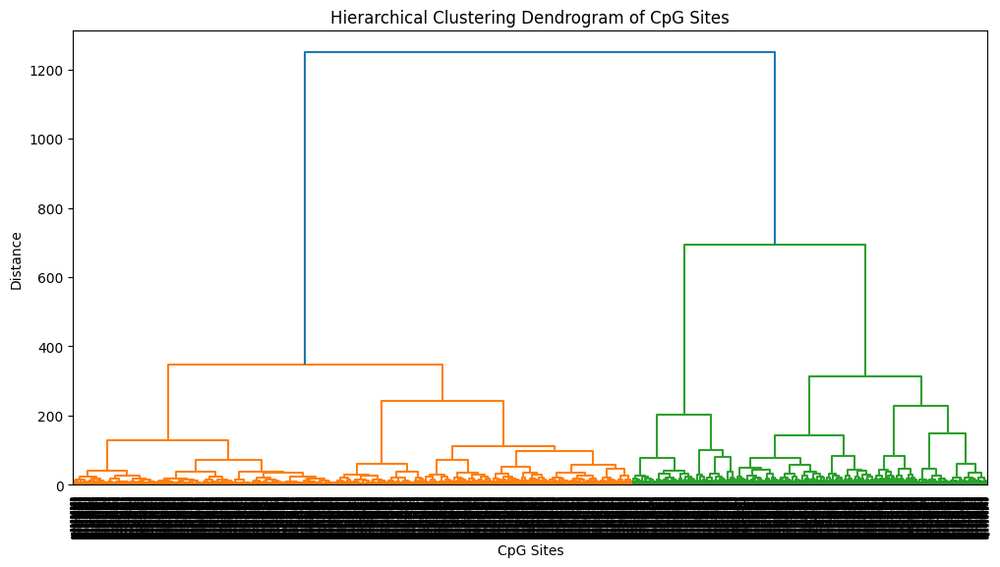

In [51]:
# Perform hierarchical clustering on the correlation matrix
linkage = hierarchy.linkage(corr_matrix, method='ward')

# Plot the dendrogram to visualize clusters
plt.figure(figsize=(12, 6))
dendrogram = hierarchy.dendrogram(linkage, labels=corr_matrix.columns, leaf_rotation=90)
plt.title('Hierarchical Clustering Dendrogram of CpG Sites')
plt.xlabel('CpG Sites')
plt.ylabel('Distance')
plt.show()

/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.

/usr/local/lib/python3.10/dist-packages/seaborn/matrix.py:560: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



<Figure size 3000x2000 with 0 Axes>

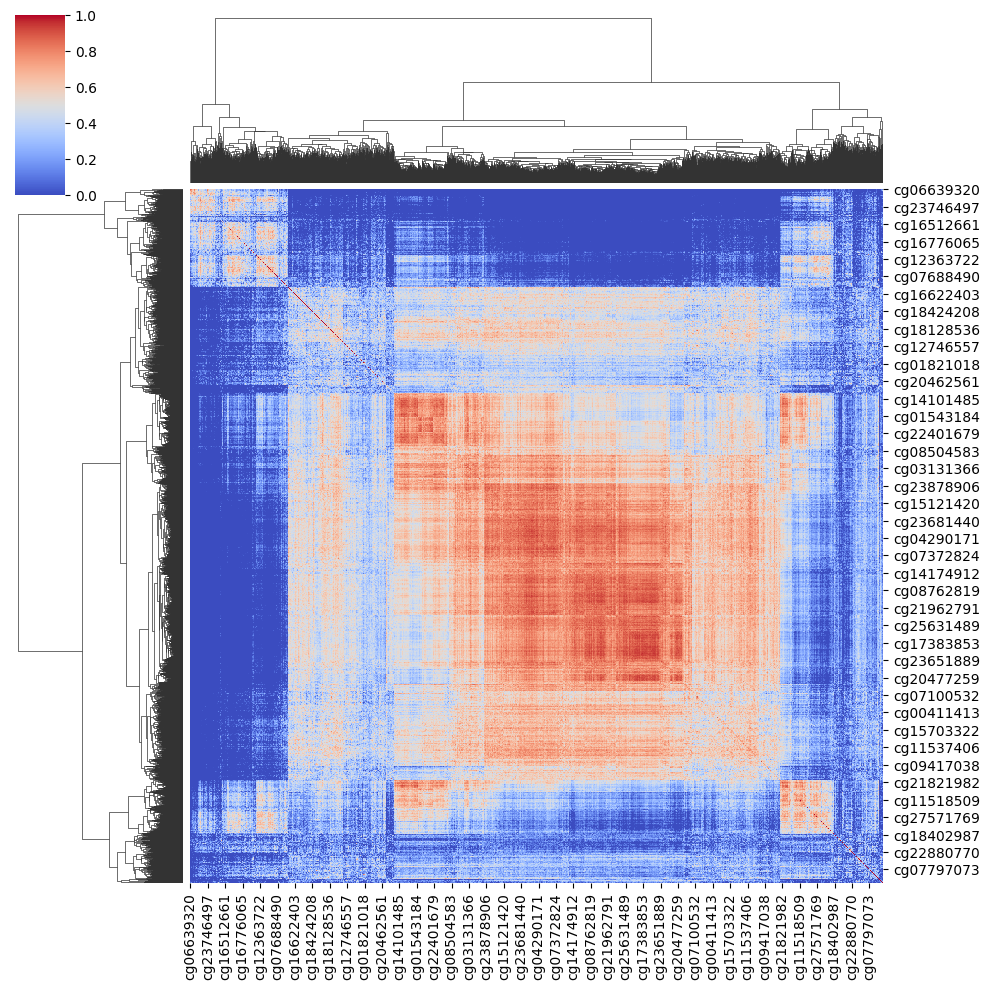

In [52]:
plt.figure(figsize=(30, 20))
s = sns.clustermap(corr_matrix, annot=False, cmap='coolwarm',vmin=0,vmax=1,)
# plt.xlabel('Nearest Neighbor Index')
# plt.ylabel('Data Point Index')
# plt.title('Distances to Nearest Neighbors')
plt.show()

In [53]:
clustermap_results = np.array(cut_clustermap_tree(s, 8, False))

In [54]:
clustermap_results

array([1, 2, 2, ..., 3, 5, 5])

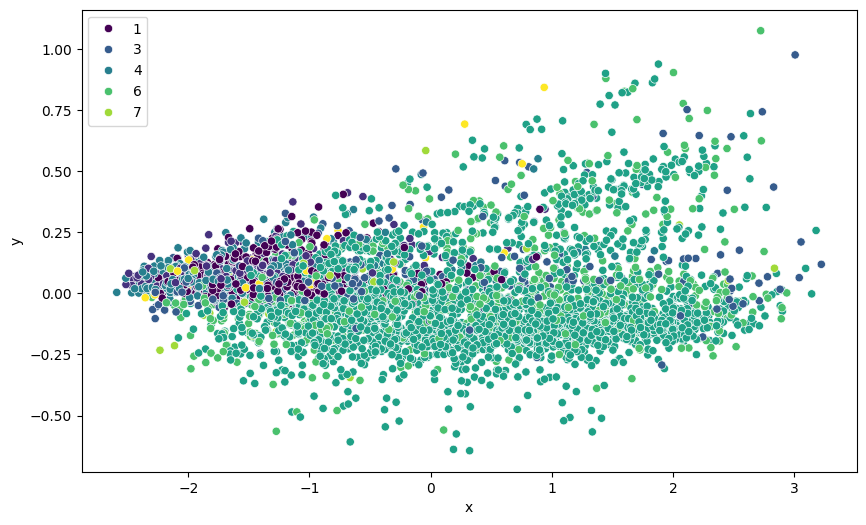

In [55]:
plot_pca(clustermap_results)

In [ ]:
# calculate_clusters_statistics(subdf, clustermap_results)

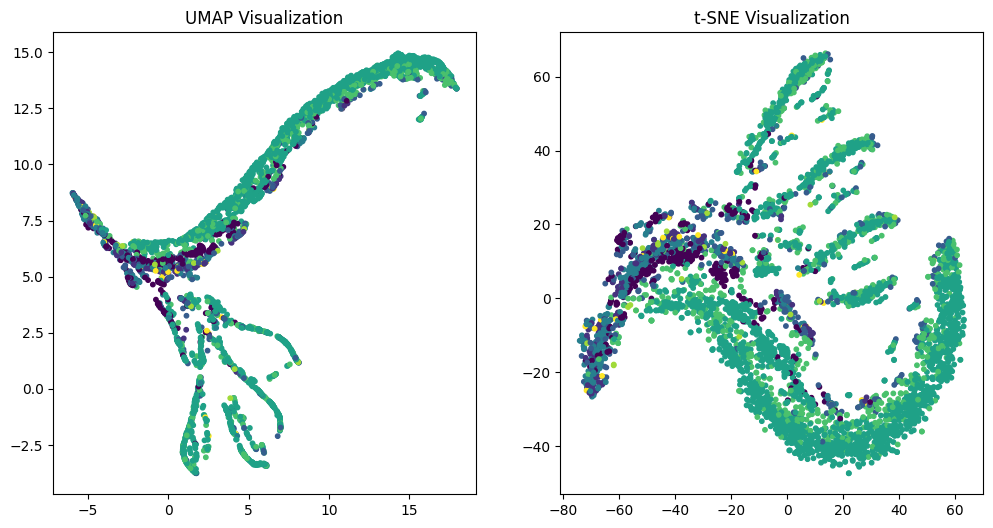

In [56]:
plot_umap_and_tsne(clustermap_results)

## DBSCAN

In [57]:
dbscan = DBSCAN(eps=1, min_samples=2)

# Fit the model
dbscan.fit(corr_matrix)

# Get cluster labels
cluster_labels = dbscan.labels_

print(cluster_labels)

[-1 -1 -1 ... -1 -1 -1]


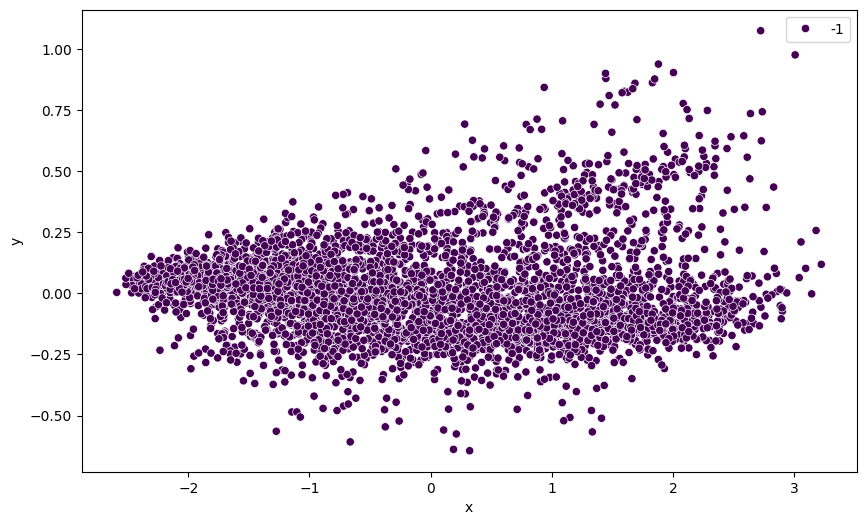

In [58]:
plot_pca(cluster_labels)

In [ ]:
# calculate_clusters_statistics(subdf, cluster_labels)

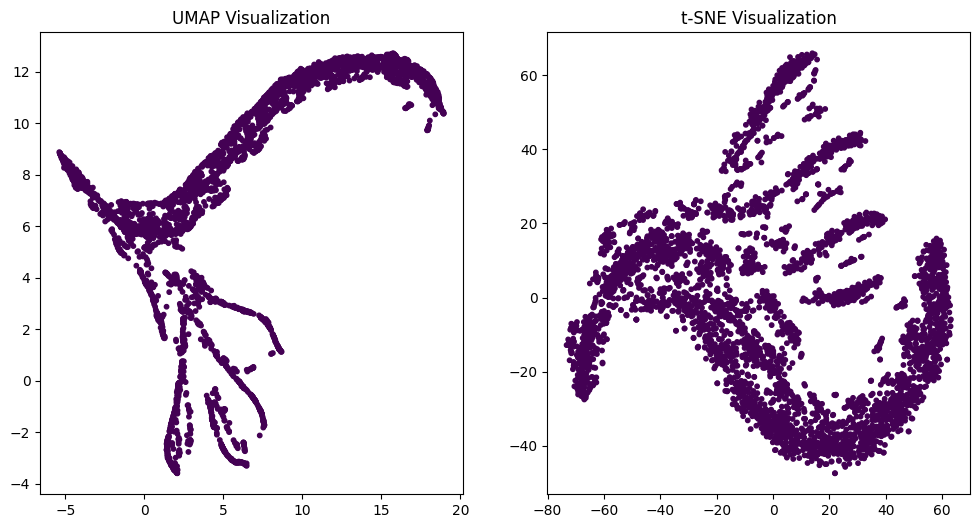

In [59]:
plot_umap_and_tsne(cluster_labels)

## Gaussian Mixture

In [142]:
%%time
gmm = GaussianMixture(n_components=8, random_state=42)
gmm.covariance_type = 'diag'
# gmm.init_params = 'kmeans'
gmm.fit(corr_matrix)
cluster_labels_gmm = gmm.predict(corr_matrix)
cluster_labels_gmm

CPU times: user 20.1 s, sys: 4.54 s, total: 24.7 s
Wall time: 1min 12s


array([2, 7, 7, ..., 5, 1, 1])

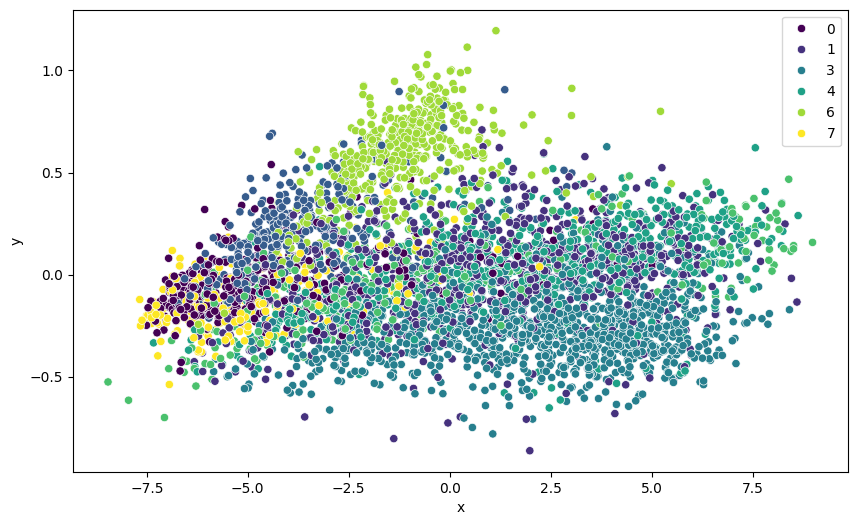

In [143]:
plot_pca(cluster_labels_gmm)

In [ ]:
# calculate_clusters_statistics(subdf, cluster_labels_gmm)

In [144]:
plot_umap_and_tsne(cluster_labels_gmm)

TypeError: Feature names are only supported if all input features have string names, but your input has ['float', 'str'] as feature name / column name types. If you want feature names to be stored and validated, you must convert them all to strings, by using X.columns = X.columns.astype(str) for example. Otherwise you can remove feature / column names from your input data, or convert them all to a non-string data type.

In [145]:
x_for_pca['clusters'] = cluster_labels_gmm
clustering_results = x_for_pca[['clusters']]
clustering_results.to_csv(f'{cohort_name[:9]}GM_clustering_results.csv')

# Trends

In [146]:
df_trans = peak_df.T
df_trans.columns = df_trans.columns.astype(int)
# Define the window size
window_size = 2

# Create an empty DataFrame to store the results

mean_window_df = pd.DataFrame(index=df_trans.T.columns)

# Loop through each age
for age in df_trans.columns:
    # Define the age range for the window
    # age = int(age)
    age_range = list(range(age - window_size, age + window_size + 1))
    age_range = [a for a in age_range if a >= df_trans.columns.min() and a <= df_trans.columns.max()]

    # age_range = age_range[(age_range >= df_trans.columns.min()) & (age_range <= df_trans.columns.max())]  # Ensure age range is within column range
    # print(age_range)
    # Calculate the mean for each CpG over the age range

    mean_values = df_trans[age_range].mean(axis=1)

    # Add the mean values to the DataFrame
    mean_window_df[age] = mean_values

# Transpose the DataFrame to have ages as rows and CpGs as columns
mean_window_df = mean_window_df.T
mean_window_df.head()

,cg00008647,cg00295572,cg00346208,cg00448707,cg00563824,cg00664416,cg00764612,cg00908766,cg00951395,cg01101873,...,cg18855195,cg19543968,cg19558972,cg19713460,cg19800640,cg19855470,cg21401457,cg21445911,cg24435209,cg26169700
67,0.143566,0.081029,0.131869,0.623844,0.158553,0.170701,0.254243,0.440172,0.220727,0.390946,...,0.327637,0.254013,0.215897,0.166144,0.761994,0.227637,0.408622,0.764529,0.427321,0.694051
49,0.140999,0.067042,0.102751,0.648187,0.157766,0.171012,0.226420,0.474774,0.237859,0.445484,...,0.374199,0.275706,0.224071,0.157831,0.837235,0.213568,0.413305,0.832355,0.472545,0.763424
53,0.106691,0.066981,0.109968,0.636140,0.142742,0.146709,0.232714,0.422170,0.239331,0.406988,...,0.371172,0.269549,0.214477,0.146615,0.770680,0.214351,0.377179,0.772347,0.458959,0.718518
62,0.112648,0.068601,0.110890,0.641132,0.143511,0.186507,0.249299,0.465086,0.224853,0.429347,...,0.351518,0.267726,0.212302,0.148262,0.763141,0.213693,0.363143,0.773007,0.477872,0.743553
33,0.145499,0.070496,0.101116,0.657058,0.164817,0.179887,0.240767,0.587335,0.255789,0.512298,...,0.407799,0.338336,0.233050,0.156479,0.853669,0.202467,0.465331,0.825300,0.503409,0.829079


In [147]:
mean_window_df = mean_window_df.sort_index()
mean_window_df.head()

,cg00008647,cg00295572,cg00346208,cg00448707,cg00563824,cg00664416,cg00764612,cg00908766,cg00951395,cg01101873,...,cg18855195,cg19543968,cg19558972,cg19713460,cg19800640,cg19855470,cg21401457,cg21445911,cg24435209,cg26169700
18,0.217077,0.035350,0.119327,0.672513,0.193396,0.265815,0.306462,0.654435,0.296330,0.619738,...,0.510829,0.399317,0.259163,0.220574,0.815767,0.231295,0.599741,0.830586,0.568579,0.880675
19,0.217077,0.035350,0.119327,0.672513,0.193396,0.265815,0.306462,0.654435,0.296330,0.619738,...,0.510829,0.399317,0.259163,0.220574,0.815767,0.231295,0.599741,0.830586,0.568579,0.880675
20,0.182791,0.043858,0.117688,0.648468,0.172184,0.233387,0.282552,0.657819,0.295816,0.603393,...,0.477270,0.388913,0.246914,0.190674,0.822665,0.219197,0.580860,0.830586,0.573670,0.868669
21,0.180058,0.052366,0.124666,0.640496,0.152395,0.196266,0.270903,0.630140,0.344547,0.599117,...,0.457464,0.407652,0.238400,0.178348,0.847339,0.203925,0.540281,0.852927,0.584477,0.868850
22,0.170579,0.058317,0.101501,0.647890,0.152895,0.191664,0.252955,0.670988,0.331297,0.610795,...,0.478817,0.421460,0.232598,0.172586,0.867338,0.192249,0.520777,0.854312,0.602080,0.876923


### for k means

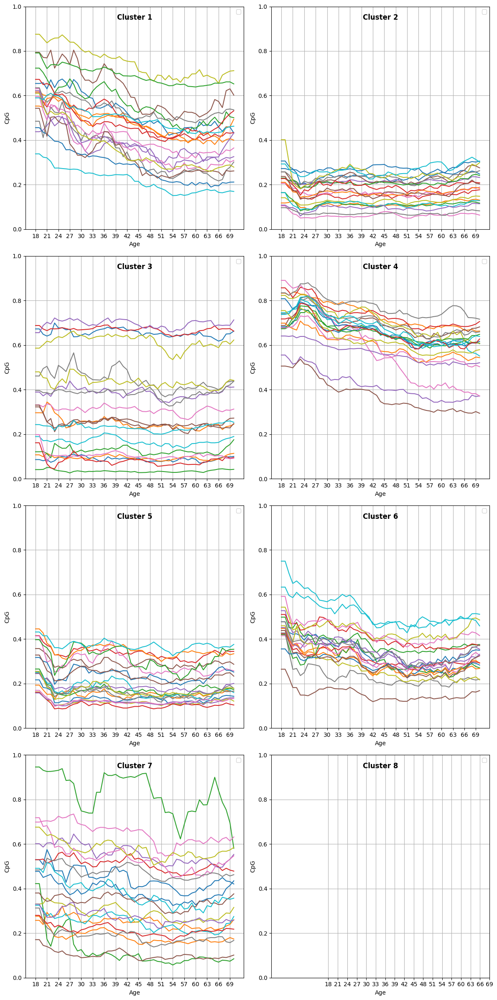

In [79]:
df_mean_for_statistics = mean_window_df.T
df_mean_for_statistics['cluster'] = kmeans.labels_
# Calculate the number of clusters and number of rows and columns for subplots
num_clusters = len(df_mean_for_statistics['cluster'].unique())
num_rows = num_clusters // 2
num_cols = 2

# Create a figure and axis objects
fig, axs = plt.subplots(num_rows, num_cols, figsize=(12, 6*num_rows))

# Flatten the axis objects if there is only one row
if num_rows == 1:
    axs = axs.reshape(1, -1)

# Loop through each cluster
for cluster_id in range(1, num_clusters + 1):
    # Filter data for the current cluster
    cluster_data = df_mean_for_statistics[df_mean_for_statistics['cluster'] == cluster_id]

    # Calculate subplot index
    row_idx = (cluster_id - 1) // num_cols
    col_idx = (cluster_id - 1) % num_cols

    # Create a subplot for the current cluster
    ax = axs[row_idx, col_idx]

    # Loop through each CpG site in the cluster and plot
    for cg_value in cluster_data.index[:20]:
        # Filter data for the current CpG site
        subset = mean_window_df[[cg_value]].sort_index()
        # Plot the scatter plot for the current CpG site
        ax.plot(subset.index, subset[cg_value], label='')#label=f'CpG={cg_value}')

    # Set Y-axis limits to be from 0 to 1
    ax.set_ylim(0, 1)

    # Add labels and legend
    ax.set_yticks(np.arange(0, 1.1, 0.2))
    ax.set_xticks(np.arange(18, 70, 3))

    ax.set_xlabel('Age')
    ax.set_ylabel('CpG')
    ax.grid(True)
    ax.legend(loc='upper right')
    ax.text(0.5, 0.95, f'Cluster {cluster_id}', ha='center', va='center', transform=ax.transAxes, fontsize=12, fontweight='bold')


# Adjust layout
plt.tight_layout()
plt.show()


### for hierarchical clustering

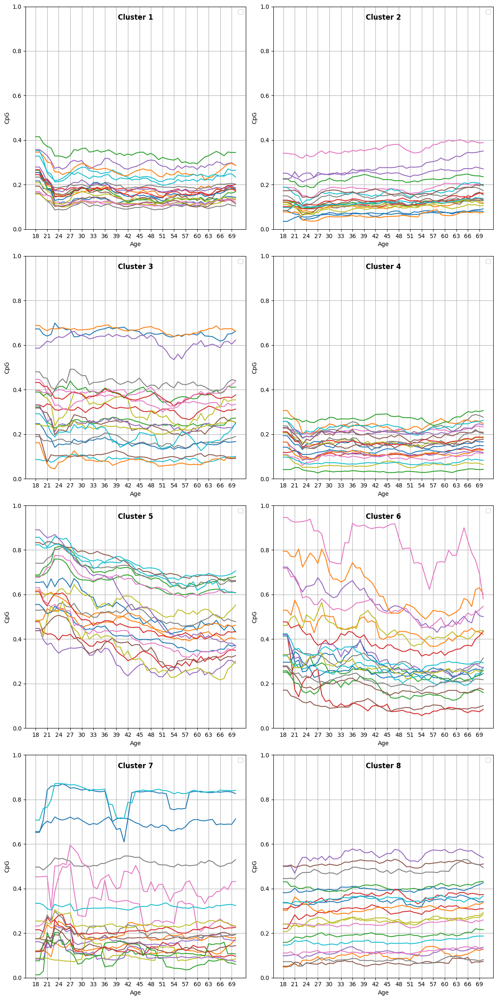

In [80]:
df_mean_for_statistics = mean_window_df.T
df_mean_for_statistics['cluster'] = clustermap_results
# Calculate the number of clusters and number of rows and columns for subplots
num_clusters = len(df_mean_for_statistics['cluster'].unique())
num_rows = num_clusters // 2
num_cols = 2

# Create a figure and axis objects
fig, axs = plt.subplots(num_rows, num_cols, figsize=(12, 6*num_rows))

# Flatten the axis objects if there is only one row
if num_rows == 1:
    axs = axs.reshape(1, -1)

# Loop through each cluster
for cluster_id in range(1, num_clusters + 1):
    # Filter data for the current cluster
    cluster_data = df_mean_for_statistics[df_mean_for_statistics['cluster'] == cluster_id]

    # Calculate subplot index
    row_idx = (cluster_id - 1) // num_cols
    col_idx = (cluster_id - 1) % num_cols

    # Create a subplot for the current cluster
    ax = axs[row_idx, col_idx]

    # Loop through each CpG site in the cluster and plot
    for cg_value in cluster_data.index[:20]:
        # Filter data for the current CpG site
        subset = mean_window_df[[cg_value]].sort_index()
        # Plot the scatter plot for the current CpG site
        ax.plot(subset.index, subset[cg_value], label='')#label=f'CpG={cg_value}')

    # Set Y-axis limits to be from 0 to 1
    ax.set_ylim(0, 1)

    # Add labels and legend
    ax.set_yticks(np.arange(0, 1.1, 0.2))
    ax.set_xticks(np.arange(18, 70, 3))

    ax.set_xlabel('Age')
    ax.set_ylabel('CpG')
    ax.grid(True)
    ax.legend(loc='upper right')
    ax.text(0.5, 0.95, f'Cluster {cluster_id}', ha='center', va='center', transform=ax.transAxes, fontsize=12, fontweight='bold')


# Adjust layout
plt.tight_layout()
plt.show()


### for GM

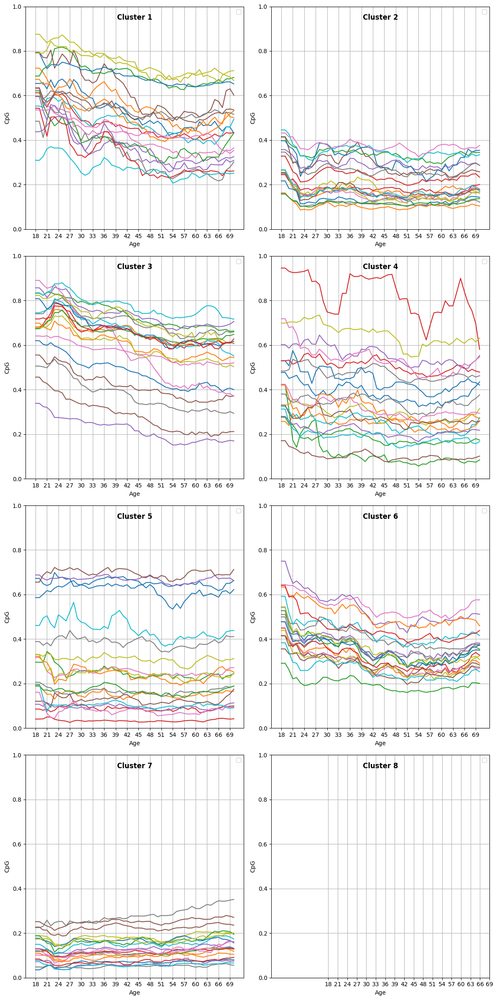

In [148]:
df_mean_for_statistics = mean_window_df.T
df_mean_for_statistics['cluster'] = cluster_labels_gmm
# Calculate the number of clusters and number of rows and columns for subplots
num_clusters = len(df_mean_for_statistics['cluster'].unique())
num_rows = num_clusters // 2
num_cols = 2

# Create a figure and axis objects
fig, axs = plt.subplots(num_rows, num_cols, figsize=(12, 6*num_rows))

# Flatten the axis objects if there is only one row
if num_rows == 1:
    axs = axs.reshape(1, -1)

# Loop through each cluster
for cluster_id in range(1, num_clusters + 1):
    # Filter data for the current cluster
    cluster_data = df_mean_for_statistics[df_mean_for_statistics['cluster'] == cluster_id]

    # Calculate subplot index
    row_idx = (cluster_id - 1) // num_cols
    col_idx = (cluster_id - 1) % num_cols

    # Create a subplot for the current cluster
    ax = axs[row_idx, col_idx]

    # Loop through each CpG site in the cluster and plot
    for cg_value in cluster_data.index[:20]:
        # Filter data for the current CpG site
        subset = mean_window_df[[cg_value]].sort_index()
        # Plot the scatter plot for the current CpG site
        ax.plot(subset.index, subset[cg_value], label='')#label=f'CpG={cg_value}')

    # Set Y-axis limits to be from 0 to 1
    ax.set_ylim(0, 1)

    # Add labels and legend
    ax.set_yticks(np.arange(0, 1.1, 0.2))
    ax.set_xticks(np.arange(18, 70, 3))

    ax.set_xlabel('Age')
    ax.set_ylabel('CpG')
    ax.grid(True)
    ax.legend(loc='upper right')
    ax.text(0.5, 0.95, f'Cluster {cluster_id}', ha='center', va='center', transform=ax.transAxes, fontsize=12, fontweight='bold')


# Adjust layout
plt.tight_layout()
plt.show()


In [ ]:
mean_window_df.to_csv('mean_window_GSE42861.csv')

# Whole PBMC analysis

In [33]:
subdf_idx = df_all_annot.index

In [34]:
idx_in_df = list(df.index)
dupls_in_df = list(set(n for n in idx_in_df if idx_in_df.count(n) > 1))
df.loc[dupls_in_df]

,cg00008647,cg00295572,cg00346208,cg00448707,cg00563824,cg00664416,cg00764612,cg00908766,cg00951395,cg01101873,...,cg18855195,cg19543968,cg19558972,cg19713460,cg19800640,cg19855470,cg21401457,cg21445911,cg24435209,cg26169700
index,,,,,,,,,,,,,,,,,,,,,
GSM1051754,0.122818,0.062420,0.082316,0.704523,0.184828,0.136800,0.252710,0.695340,0.323313,0.489348,...,0.246839,0.434571,0.426777,0.130065,0.875597,0.203478,0.564208,0.814656,0.576675,0.806371
GSM1051754,0.124610,0.056654,0.082812,0.711713,0.192771,0.143132,0.250921,0.689468,0.299247,0.499675,...,0.264578,0.418849,0.424798,0.128338,0.884602,0.199650,0.562350,0.816834,0.585800,0.794740
GSM1051984,0.255718,0.190501,0.207580,0.790361,0.290070,0.184965,0.371691,0.519628,0.403768,0.534902,...,0.459112,0.342351,0.448726,0.243308,0.864692,0.261133,0.687011,0.819377,0.626011,0.839465
GSM1051984,0.300905,0.208743,0.222716,0.770466,0.340866,0.203821,0.359091,0.532078,0.414305,0.526963,...,0.463667,0.326311,0.433611,0.251214,0.839599,0.267952,0.716560,0.819960,0.621274,0.833394


In [38]:
df_all_annot

,cell type,disease state,subject,age,gender,smoking status,cohort,cohort_type,age at menarche,cancer type (icd-10),...,rs718314,rs7481311,rs7498665,rs7647305,rs7832552,rs824931,rs887912,rs984222,rs9939609,family
GSM,,,,,,,,,,,,,,,,,,,,,
GSM1051525,PBL,rheumatoid arthritis,Patient,67.000,f,current,GSE42861_annot.csv,leiko,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GSM1051526,PBL,rheumatoid arthritis,Patient,49.000,f,current,GSE42861_annot.csv,leiko,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GSM1051527,PBL,rheumatoid arthritis,Patient,53.000,f,ex,GSE42861_annot.csv,leiko,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GSM1051528,PBL,rheumatoid arthritis,Patient,62.000,f,current,GSE42861_annot.csv,leiko,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GSM1051529,PBL,rheumatoid arthritis,Patient,33.000,f,never,GSE42861_annot.csv,leiko,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GSM1236377,NaN,NaN,NaN,48.457,F,NaN,GSE51057_annot.csv,leiko,13.0,C50,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GSM1236378,NaN,NaN,NaN,48.780,F,NaN,GSE51032_annot.csv,leiko,10.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GSM1236378,NaN,NaN,NaN,48.780,F,NaN,GSE51057_annot.csv,leiko,10.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# subdf_idx = subdf_idx.drop(dupls_in_df)
df_all_annot = df_all_annot.loc[subdf_idx]
df = df.loc[subdf_idx]
len(df) == len(df_all_annot)

In [40]:
df = df.join(df_all_annot['age'])
df.columns

Index(['cg00008647', 'cg00295572', 'cg00346208', 'cg00448707', 'cg00563824',
       'cg00664416', 'cg00764612', 'cg00908766', 'cg00951395', 'cg01101873',
       ...
       'cg19543968', 'cg19558972', 'cg19713460', 'cg19800640', 'cg19855470',
       'cg21401457', 'cg21445911', 'cg24435209', 'cg26169700', 'age'],
      dtype='object', length=4457)

In [42]:
df.shape

(3515, 4457)

In [47]:
# Function to compute peak values for a single CpG site
def compute_peak_values(cpg_site):
    peak_values = []
    for age in df['age'].unique():
        subset = df[df['age'] == age][cpg_site]
        density, bins = np.histogram(subset, bins=30, density=True)
        peaks, _ = find_peaks(density, height=0)
        if len(peaks) > 0:
            peak_values.append(bins[peaks[0]])
        else:
            peak_values.append(np.nan)
    return peak_values

In [ ]:
%%time

# Create an instance of ProcessPoolExecutor
with ProcessPoolExecutor(max_workers=4) as executor:
    # Submit tasks for each CpG site
    futures = [executor.submit(compute_peak_values, cpg_site) for cpg_site in df.columns[:-1]]

    # Retrieve results
    peak_values_all_cpg = [future.result() for future in futures]

# Convert the list of lists to a DataFrame
peak_values_df = pd.DataFrame(peak_values_all_cpg, index=df.columns[:-1], columns=df['age'].unique()).T

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning:

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.

/usr/local/lib/python3.10/dist-packages/numpy/lib/histograms.py:885: RuntimeWarning:

divide by zero encountered in divide

/usr/local/lib/python3.10/dist-packages/numpy/lib/histograms.py:885: RuntimeWarning:

invalid value encountered in divide

/usr/local/lib/python3.10/dist-packages/numpy/lib/histograms.py:885: RuntimeWarning:

divide by zero encountered in divide

/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning:

os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.

/usr/local/lib/python3.10/dist-packages/numpy/lib/histograms.py:885: RuntimeWarning:

divide by zero encountered in divide

/usr/local/lib/python3.10/dist-packages/numpy/lib/histograms.py:885: RuntimeWarning

In [51]:
peak_values_df = peak_values_df.sort_index()
peak_values_df.head()

,cg00008647,cg00295572,cg00346208,cg00448707,cg00563824,cg00664416,cg00764612,cg00908766,cg00951395,cg01101873,...,cg18855195,cg19543968,cg19558972,cg19713460,cg19800640,cg19855470,cg21401457,cg21445911,cg24435209,cg26169700
1.000000,0.108154,0.089437,0.147150,0.710120,0.151313,0.212086,0.267615,0.628234,0.320082,0.531295,...,0.452649,0.372807,0.251165,0.162933,0.882422,0.213480,0.546229,0.841378,0.557274,0.834416
1.083333,0.143779,0.083461,0.133684,0.698195,0.177996,0.211499,0.262981,0.552602,0.326544,0.539185,...,0.452590,0.362316,0.253695,0.158679,0.662127,0.221272,0.544482,0.851175,0.505684,0.832397
1.166667,0.119253,0.054882,0.149779,0.724379,0.222509,0.219996,0.271514,0.727437,0.392743,0.522625,...,0.464880,0.361293,0.345555,0.204217,0.888022,0.223934,0.634218,0.846366,0.579635,0.857421
1.250000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1.333333,0.126026,0.088067,NaN,NaN,0.175938,0.252062,0.273072,0.613185,0.373505,NaN,...,0.456687,0.361849,0.319683,0.179751,NaN,0.222645,NaN,0.846455,0.556692,0.833314


In [52]:
peak_values_df.index

Index([               1.0, 1.0833333333333333, 1.1666666666666667,
                     1.25, 1.3333333333333333, 1.4166666666666667,
                      1.5, 1.5833333333333333, 1.8333333333333333,
       1.9166666666666667,
       ...
                   65.854,               66.0,             66.319,
                     67.0,               68.0,               69.0,
                     70.0,             70.064,             70.393,
                      nan],
      dtype='float64', length=437)

In [ ]:
peak_values_df.to_csv(f'PBMC_peak_values.csv')

In [53]:
%%time
corr_matrix = peak_values_df.corr()
corr_matrix.head()

CPU times: user 25.4 s, sys: 200 ms, total: 25.6 s
Wall time: 25.8 s


,cg00008647,cg00295572,cg00346208,cg00448707,cg00563824,cg00664416,cg00764612,cg00908766,cg00951395,cg01101873,...,cg18855195,cg19543968,cg19558972,cg19713460,cg19800640,cg19855470,cg21401457,cg21445911,cg24435209,cg26169700
cg00008647,1.000000,0.555423,0.586807,0.109522,0.504698,0.436740,0.618701,0.150282,0.249746,0.195203,...,0.298644,0.031790,0.258363,0.587643,0.032482,0.386449,0.244832,0.029874,0.144694,0.113162
cg00295572,0.555423,1.000000,0.606481,0.145404,0.471941,0.504810,0.657225,0.121181,0.268709,0.158935,...,0.254398,0.011820,0.265697,0.560278,0.094478,0.381145,0.194667,0.063433,0.183774,0.153642
cg00346208,0.586807,0.606481,1.000000,0.156589,0.562193,0.512728,0.707114,0.167346,0.309521,0.163130,...,0.305881,-0.023559,0.231018,0.588264,0.086327,0.401725,0.260160,0.042687,0.190691,0.168474
cg00448707,0.109522,0.145404,0.156589,1.000000,0.184293,0.209361,0.253816,0.171436,0.232612,0.221050,...,0.198866,0.156975,0.164856,0.124497,0.134774,0.151417,0.210694,0.059708,0.222762,0.270172
cg00563824,0.504698,0.471941,0.562193,0.184293,1.000000,0.481208,0.584744,0.182556,0.278106,0.239624,...,0.291224,0.043049,0.298639,0.473301,0.132088,0.303496,0.297107,0.024546,0.136213,0.265326


In [54]:
%%time
km_scores= []
# km_silhouette = []
# vmeasure_score =[]
# db_score = []
# scaler = StandardScaler()
# x_s = scaler.fit_transform(corr_matrix)

for i in range(2,15):
    km = KMeans(n_clusters=i, random_state=0).fit(corr_matrix);
    preds = km.predict(corr_matrix);
    km_scores.append(-km.score(corr_matrix))

CPU times: user 8min 8s, sys: 15.2 s, total: 8min 23s
Wall time: 5min 16s


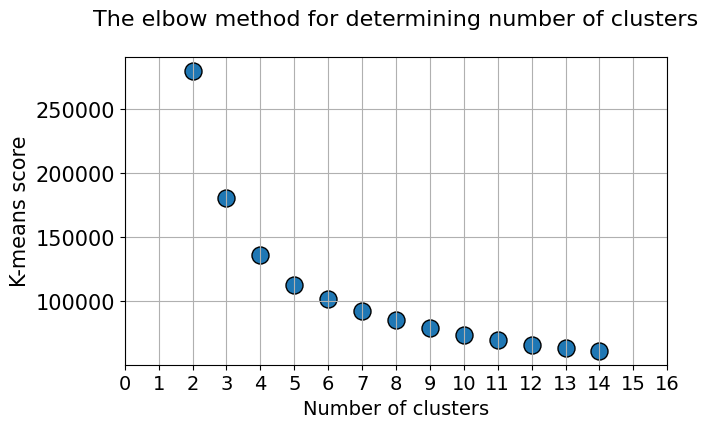

In [55]:
plt.figure(figsize=(7,4))
plt.title("The elbow method for determining number of clusters\n",fontsize=16)
plt.scatter(x=[i for i in range(2,15)],y=km_scores,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Number of clusters",fontsize=14)
plt.ylabel("K-means score",fontsize=15)
plt.xticks([i for i in range(0,17)],fontsize=14)
plt.yticks(fontsize=15)
plt.show();

In [63]:
%%time
gmm = GaussianMixture(n_components=8, random_state=42)
gmm.covariance_type = 'diag'
# gmm.init_params = 'kmeans'
gmm.fit(corr_matrix)
cluster_labels_gmm = gmm.predict(corr_matrix)
cluster_labels_gmm

CPU times: user 17.3 s, sys: 6.41 s, total: 23.7 s
Wall time: 14.4 s


array([0, 0, 0, ..., 6, 4, 4])

In [56]:
x_for_pca = peak_values_df.T.fillna(0)
pca = PCA(n_components=2)
components = pca.fit_transform(x_for_pca)
print(pca.explained_variance_ratio_)
print(pca.singular_values_)

[0.92061874 0.00594654]
[253.65632315  20.38627958]


In [57]:
components_df = pd.DataFrame(components, columns=['x', 'y'])

In [58]:
x_for_pca

,1.000000,1.083333,1.166667,1.250000,1.333333,1.416667,1.500000,1.583333,1.833333,1.916667,...,65.854000,66.000000,66.319000,67.000000,68.000000,69.000000,70.000000,70.064000,70.393000,NaN
cg00008647,0.108154,0.143779,0.119253,0.0,0.126026,0.175645,0.0,0.0,0.183051,0.0,...,0.188802,0.154234,0.181555,0.152444,0.114864,0.151377,0.164362,0.240007,0.169280,0.0
cg00295572,0.089437,0.083461,0.054882,0.0,0.088067,0.076267,0.0,0.0,0.148958,0.0,...,0.141337,0.086097,0.075183,0.084506,0.054849,0.082160,0.103892,0.133470,0.080152,0.0
cg00346208,0.147150,0.133684,0.149779,0.0,0.000000,0.168664,0.0,0.0,0.163403,0.0,...,0.211812,0.152829,0.161284,0.149257,0.096198,0.122990,0.134486,0.268127,0.227548,0.0
cg00448707,0.710120,0.698195,0.724379,0.0,0.000000,0.722834,0.0,0.0,0.690584,0.0,...,0.804538,0.645313,0.754818,0.614243,0.617884,0.603907,0.767339,0.747514,0.747477,0.0
cg00563824,0.151313,0.177996,0.222509,0.0,0.175938,0.189820,0.0,0.0,0.181766,0.0,...,0.281356,0.184423,0.152282,0.165227,0.143382,0.133800,0.220735,0.318447,0.177297,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cg19855470,0.213480,0.221272,0.223934,0.0,0.222645,0.252145,0.0,0.0,0.259089,0.0,...,0.259536,0.226944,0.232443,0.228704,0.234547,0.228762,0.235885,0.257507,0.254417,0.0
cg21401457,0.546229,0.544482,0.634218,0.0,0.000000,0.568048,0.0,0.0,0.559460,0.0,...,0.678335,0.414667,0.541564,0.476210,0.319271,0.381060,0.471407,0.621999,0.514242,0.0
cg21445911,0.841378,0.851175,0.846366,0.0,0.846455,0.853429,0.0,0.0,0.824679,0.0,...,0.823089,0.498304,0.836022,0.850477,0.817311,0.831822,0.835440,0.817803,0.622668,0.0
cg24435209,0.557274,0.505684,0.579635,0.0,0.556692,0.592312,0.0,0.0,0.592787,0.0,...,0.565366,0.467797,0.530098,0.443729,0.392363,0.415543,0.559256,0.573367,0.569732,0.0


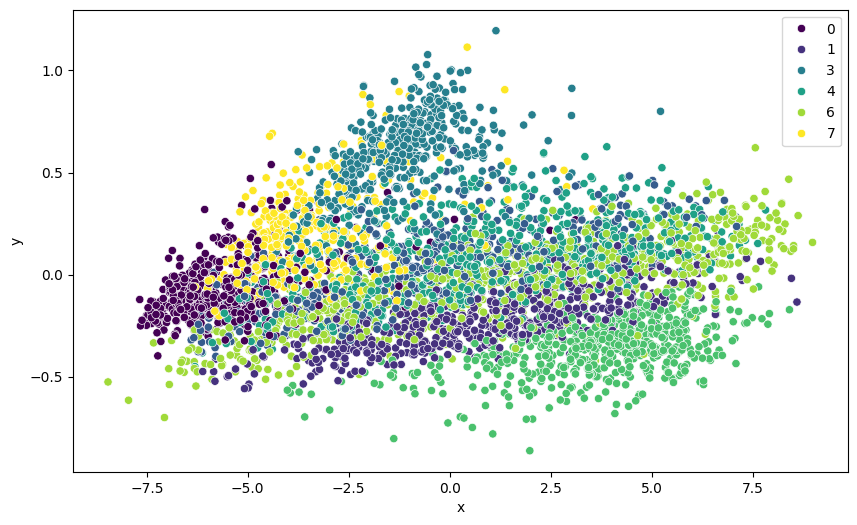

In [64]:
plot_pca(cluster_labels_gmm)

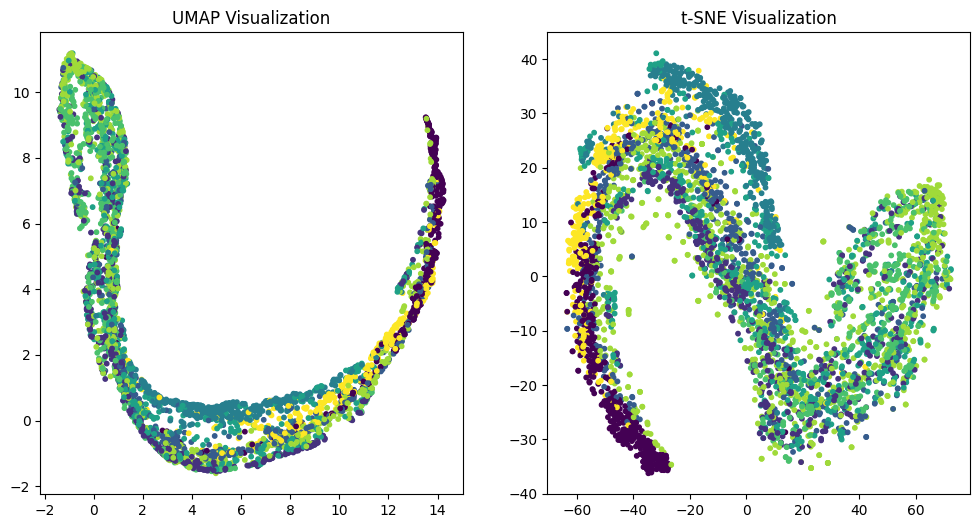

In [65]:
plot_umap_and_tsne(cluster_labels_gmm)

In [72]:
# peak_values_df.index = peak_values_df.index.round()
peak_values_df = peak_values_df[~peak_values_df.index.isin([np.nan, np.inf, -np.inf])]
peak_values_df.index = peak_values_df.index.astype(int)
# Group by the rounded age index and calculate the mean for each group
grouped_mean = peak_values_df.groupby(peak_values_df.index).mean()


grouped_mean


,cg00008647,cg00295572,cg00346208,cg00448707,cg00563824,cg00664416,cg00764612,cg00908766,cg00951395,cg01101873,...,cg18855195,cg19543968,cg19558972,cg19713460,cg19800640,cg19855470,cg21401457,cg21445911,cg24435209,cg26169700
1,0.142651,0.090179,0.152536,0.709222,0.183224,0.230960,0.278993,0.626871,0.361373,0.527580,...,0.452035,0.369036,0.281921,0.203617,0.839915,0.232094,0.570487,0.843914,0.564064,0.838368
2,0.164356,0.093938,0.148583,0.717843,0.215201,0.222130,0.291848,0.651192,0.348352,0.532402,...,0.463319,0.369573,0.285399,0.214094,0.863047,0.238011,0.570809,0.844426,0.574743,0.852213
3,0.158577,0.094252,0.146086,0.729551,0.213541,0.219806,0.291854,0.616299,0.364441,0.522647,...,0.447641,0.360867,0.282848,0.203432,0.714329,0.222420,0.512679,0.840526,0.565618,0.839834
4,0.162130,0.095583,0.174032,0.723731,0.191491,0.215864,0.299227,0.621410,0.375271,0.509403,...,0.451213,0.365245,0.249363,0.207516,0.774937,0.232766,0.577896,0.848106,0.589996,0.844828
5,0.189082,0.109096,0.158058,0.729331,0.189944,0.231346,0.321914,0.736866,0.398367,0.509816,...,0.423288,0.363856,0.261764,0.231177,0.896658,0.266081,0.480448,0.835882,0.551596,0.826452
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66,0.167894,0.080640,0.157057,0.700066,0.168353,0.189029,0.290005,0.561092,0.273368,0.446912,...,0.413310,0.279342,0.232603,0.178522,0.846405,0.229694,0.478116,0.667163,0.498948,0.781973
67,0.152444,0.084506,0.149257,0.614243,0.165227,0.195905,0.284598,0.538954,0.213082,0.427339,...,0.334334,0.247696,0.231480,0.185493,0.849753,0.228704,0.476210,0.850477,0.443729,0.732828
68,0.114864,0.054849,0.096198,0.617884,0.143382,0.137870,0.238302,0.422781,0.254600,0.397494,...,0.304510,0.282061,0.207216,0.168400,0.417922,0.234547,0.319271,0.817311,0.392363,0.642704
69,0.151377,0.082160,0.122990,0.603907,0.133800,0.143837,0.225441,0.331101,0.162689,0.350102,...,0.332634,0.257839,0.200965,0.162196,0.853801,0.228762,0.381060,0.831822,0.415543,0.670008


In [80]:
grouped_mean.T.dropna(axis=1)

,1,2,3,4,5,7,9,11,12,13,...,58,59,60,61,62,63,64,65,66,70
cg00008647,0.142651,0.164356,0.158577,0.162130,0.189082,0.334234,0.154842,0.164723,0.162381,0.259608,...,0.179447,0.194993,0.194528,0.191221,0.146054,0.178537,0.161699,0.177140,0.167894,0.191216
cg00295572,0.090179,0.093938,0.094252,0.095583,0.109096,0.140397,0.068326,0.122450,0.105693,0.119931,...,0.105970,0.125643,0.095859,0.115473,0.087252,0.099214,0.100965,0.118299,0.080640,0.105838
cg00346208,0.152536,0.148583,0.146086,0.174032,0.158058,0.181670,0.120404,0.178637,0.155461,0.199084,...,0.167063,0.163246,0.155411,0.178726,0.123504,0.156647,0.154690,0.178847,0.157057,0.210053
cg00448707,0.709222,0.717843,0.729551,0.723731,0.729331,0.769165,0.728468,0.741659,0.735171,0.766543,...,0.717593,0.719892,0.702352,0.721331,0.665210,0.720302,0.751859,0.726130,0.700066,0.754110
cg00563824,0.183224,0.215201,0.213541,0.191491,0.189944,0.295519,0.323083,0.230981,0.314270,0.248405,...,0.239900,0.259405,0.232150,0.233420,0.170087,0.250164,0.228339,0.222851,0.168353,0.238826
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
cg19855470,0.232094,0.238011,0.222420,0.232766,0.266081,0.241449,0.228009,0.256517,0.257511,0.273376,...,0.239515,0.235893,0.225612,0.231016,0.251412,0.243352,0.232592,0.251436,0.229694,0.249270
cg21401457,0.570487,0.570809,0.512679,0.577896,0.480448,0.653461,0.520683,0.569058,0.533448,0.579361,...,0.553300,0.569399,0.489988,0.566154,0.394365,0.586137,0.522931,0.590758,0.478116,0.535883
cg21445911,0.843914,0.844426,0.840526,0.848106,0.835882,0.859797,0.857778,0.848301,0.863709,0.789318,...,0.796448,0.773726,0.829991,0.786723,0.832531,0.811906,0.794341,0.830766,0.667163,0.758637
cg24435209,0.564064,0.574743,0.565618,0.589996,0.551596,0.600250,0.577175,0.567350,0.538246,0.591738,...,0.567716,0.542163,0.563479,0.564714,0.510724,0.541464,0.553688,0.534691,0.498948,0.567452


In [97]:
grouped_mean = grouped_mean.fillna(grouped_mean.shift(axis=0))

In [102]:
grouped_mean.loc[8] = (grouped_mean.loc[7]+grouped_mean.loc[9])/2
grouped_mean.loc[10] = (grouped_mean.loc[9]+grouped_mean.loc[11])/2
grouped_mean.loc[17] = (grouped_mean.loc[16]+grouped_mean.loc[18])/2

In [103]:
# df_trans = grouped_mean.T.fillna(mean)
df_trans = grouped_mean.T

df_trans.columns = df_trans.columns.astype(int)
# Define the window size
window_size = 2

# Create an empty DataFrame to store the results

mean_window_df = pd.DataFrame(index=df_trans.T.columns)

# Loop through each age
for age in df_trans.columns:
    # Define the age range for the window
    # age = int(age)
    age_range = list(range(age - window_size, age + window_size + 1))
    age_range = [a for a in age_range if a >= df_trans.columns.min() and a <= df_trans.columns.max()]

    # age_range = age_range[(age_range >= df_trans.columns.min()) & (age_range <= df_trans.columns.max())]  # Ensure age range is within column range
    # print(age_range)
    # Calculate the mean for each CpG over the age range

    mean_values = df_trans[age_range].mean(axis=1)

    # Add the mean values to the DataFrame
    mean_window_df[age] = mean_values

# Transpose the DataFrame to have ages as rows and CpGs as columns
mean_window_df = mean_window_df.T
mean_window_df.head()

,cg00008647,cg00295572,cg00346208,cg00448707,cg00563824,cg00664416,cg00764612,cg00908766,cg00951395,cg01101873,...,cg18855195,cg19543968,cg19558972,cg19713460,cg19800640,cg19855470,cg21401457,cg21445911,cg24435209,cg26169700
1,0.155195,0.092790,0.149069,0.718872,0.203989,0.224299,0.287565,0.631454,0.358055,0.527543,...,0.454332,0.366492,0.283389,0.207048,0.805764,0.230842,0.551325,0.842955,0.568141,0.843472
2,0.156929,0.093488,0.155309,0.720087,0.200864,0.222190,0.290481,0.628943,0.362359,0.523008,...,0.453552,0.366180,0.274883,0.207165,0.798057,0.231323,0.557968,0.844243,0.573605,0.843811
3,0.163359,0.096610,0.155859,0.721936,0.198680,0.224021,0.296767,0.650528,0.369561,0.520369,...,0.447499,0.365716,0.272259,0.211967,0.817777,0.238275,0.542464,0.842571,0.569203,0.840339
4,0.172645,0.100393,0.156964,0.725958,0.200024,0.224099,0.305351,0.672527,0.376959,0.516816,...,0.441750,0.364680,0.268227,0.217479,0.829126,0.245072,0.524456,0.840964,0.566710,0.837956
5,0.206621,0.109685,0.163581,0.736222,0.216088,0.222164,0.314265,0.645857,0.369118,0.514172,...,0.440481,0.358571,0.282826,0.228609,0.837165,0.245760,0.540986,0.844039,0.571811,0.837787


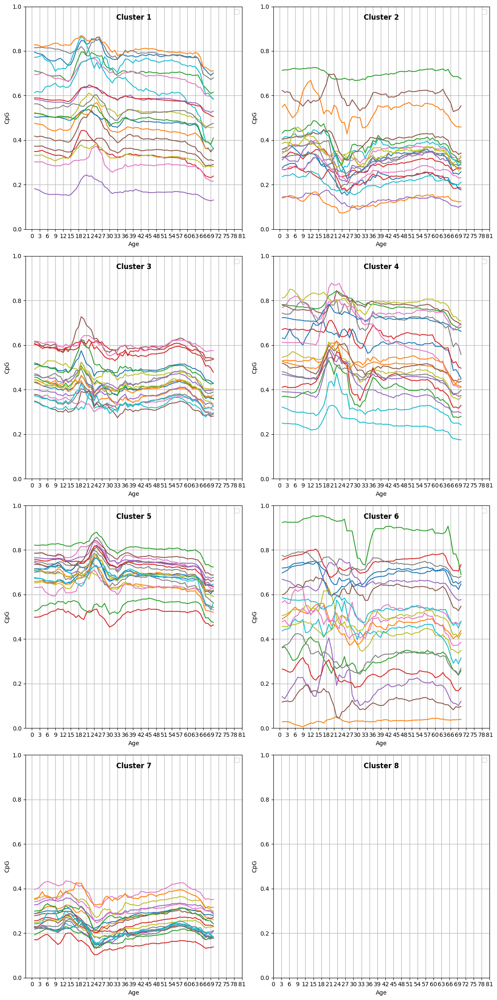

In [105]:
df_mean_for_statistics = mean_window_df.T
df_mean_for_statistics['cluster'] = cluster_labels_gmm
# Calculate the number of clusters and number of rows and columns for subplots
num_clusters = len(df_mean_for_statistics['cluster'].unique())
num_rows = num_clusters // 2
num_cols = 2

# Create a figure and axis objects
fig, axs = plt.subplots(num_rows, num_cols, figsize=(12, 6*num_rows))

# Flatten the axis objects if there is only one row
if num_rows == 1:
    axs = axs.reshape(1, -1)

# Loop through each cluster
for cluster_id in range(1, num_clusters + 1):
    # Filter data for the current cluster
    cluster_data = df_mean_for_statistics[df_mean_for_statistics['cluster'] == cluster_id]

    # Calculate subplot index
    row_idx = (cluster_id - 1) // num_cols
    col_idx = (cluster_id - 1) % num_cols

    # Create a subplot for the current cluster
    ax = axs[row_idx, col_idx]

    # Loop through each CpG site in the cluster and plot
    for cg_value in cluster_data.index[:20]:
        # Filter data for the current CpG site
        subset = mean_window_df[[cg_value]].sort_index()
        # Plot the scatter plot for the current CpG site
        ax.plot(subset.index, subset[cg_value], label='')#label=f'CpG={cg_value}')

    # Set Y-axis limits to be from 0 to 1
    ax.set_ylim(0, 1)

    # Add labels and legend
    ax.set_yticks(np.arange(0, 1.1, 0.2))
    ax.set_xticks(np.arange(0, 83, 3))

    ax.set_xlabel('Age')
    ax.set_ylabel('CpG')
    ax.grid(True)
    ax.legend(loc='upper right')
    ax.text(0.5, 0.95, f'Cluster {cluster_id}', ha='center', va='center', transform=ax.transAxes, fontsize=12, fontweight='bold')


# Adjust layout
plt.tight_layout()
plt.show()


In [106]:
cluster_labels_gmm

array([0, 0, 0, ..., 6, 4, 4])

In [107]:
x_for_pca['clusters'] = cluster_labels_gmm

In [108]:
clustering_results = x_for_pca[['clusters']]
clustering_results.to_csv('PBMC_GM_clustering_results.csv')

# Новый раздел

# Plot difined in metacohort data in GSE42861

# Новый раздел

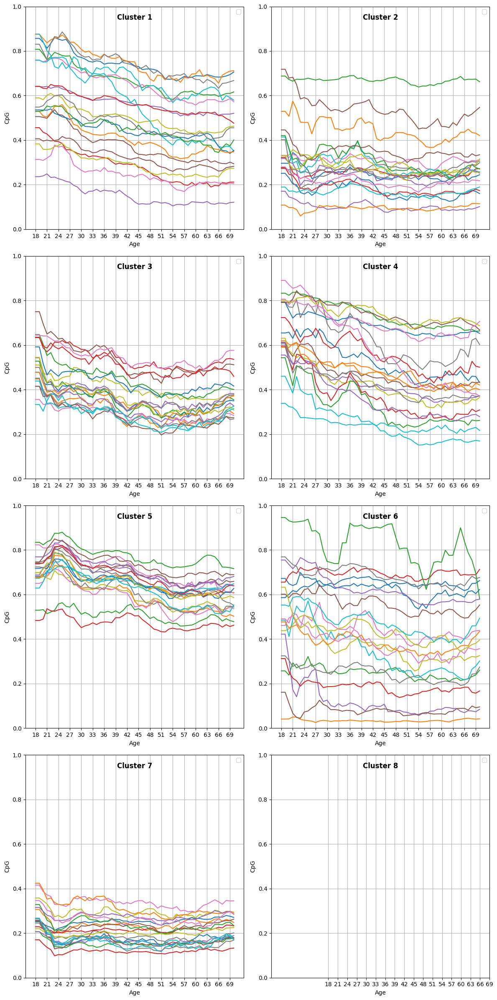

In [150]:
df_mean_for_statistics = mean_window_df.T
df_mean_for_statistics['cluster'] = pd.read_csv('PBMC_GM_clustering_results.csv', index_col=0)['clusters']
# Calculate the number of clusters and number of rows and columns for subplots
num_clusters = len(df_mean_for_statistics['cluster'].unique())
num_rows = num_clusters // 2
num_cols = 2

# Create a figure and axis objects
fig, axs = plt.subplots(num_rows, num_cols, figsize=(12, 6*num_rows))

# Flatten the axis objects if there is only one row
if num_rows == 1:
    axs = axs.reshape(1, -1)

# Loop through each cluster
for cluster_id in range(1, num_clusters + 1):
    # Filter data for the current cluster
    cluster_data = df_mean_for_statistics[df_mean_for_statistics['cluster'] == cluster_id]

    # Calculate subplot index
    row_idx = (cluster_id - 1) // num_cols
    col_idx = (cluster_id - 1) % num_cols

    # Create a subplot for the current cluster
    ax = axs[row_idx, col_idx]

    # Loop through each CpG site in the cluster and plot
    for cg_value in cluster_data.index[:20]:
        # Filter data for the current CpG site
        subset = mean_window_df[[cg_value]].sort_index()
        # Plot the scatter plot for the current CpG site
        ax.plot(subset.index, subset[cg_value], label='')#label=f'CpG={cg_value}')

    # Set Y-axis limits to be from 0 to 1
    ax.set_ylim(0, 1)

    # Add labels and legend
    ax.set_yticks(np.arange(0, 1.1, 0.2))
    ax.set_xticks(np.arange(18, 70, 3))

    ax.set_xlabel('Age')
    ax.set_ylabel('CpG')
    ax.grid(True)
    ax.legend(loc='upper right')
    ax.text(0.5, 0.95, f'Cluster {cluster_id}', ha='center', va='center', transform=ax.transAxes, fontsize=12, fontweight='bold')


# Adjust layout
plt.tight_layout()
plt.show()


In [156]:
mean_window_df.diff(axis=1).dropna(axis=1)

,cg00295572,cg00346208,cg00448707,cg00563824,cg00664416,cg00764612,cg00908766,cg00951395,cg01101873,cg01103597,...,cg18855195,cg19543968,cg19558972,cg19713460,cg19800640,cg19855470,cg21401457,cg21445911,cg24435209,cg26169700
18,-0.181727,0.083977,0.553185,-0.479116,0.072419,0.040647,0.347973,-0.358106,0.323408,0.062203,...,0.327991,-0.111512,-0.140154,-0.038589,0.595193,-0.584473,0.368446,0.230845,-0.262007,0.312096
19,-0.181727,0.083977,0.553185,-0.479116,0.072419,0.040647,0.347973,-0.358106,0.323408,0.062203,...,0.327991,-0.111512,-0.140154,-0.038589,0.595193,-0.584473,0.368446,0.230845,-0.262007,0.312096
20,-0.138933,0.073830,0.530780,-0.476285,0.061204,0.049164,0.375267,-0.362003,0.307577,0.084306,...,0.283789,-0.088356,-0.141999,-0.056240,0.631991,-0.603468,0.361663,0.249726,-0.256916,0.294999
21,-0.127692,0.072300,0.515830,-0.488101,0.043870,0.074637,0.359237,-0.285594,0.254571,0.099485,...,0.256942,-0.049812,-0.169252,-0.060052,0.668992,-0.643414,0.336356,0.312647,-0.268450,0.284373
22,-0.112261,0.043184,0.546389,-0.494996,0.038770,0.061290,0.418033,-0.339691,0.279498,0.114910,...,0.294592,-0.057357,-0.188862,-0.060012,0.694751,-0.675089,0.328528,0.333535,-0.252232,0.274843
23,-0.073181,0.039420,0.618417,-0.568455,0.027734,0.045149,0.432433,-0.339390,0.299532,0.163142,...,0.276881,-0.074368,-0.196155,-0.073018,0.724688,-0.682838,0.379228,0.295870,-0.273873,0.291343
24,-0.067654,0.038015,0.591914,-0.521051,-0.001823,0.054433,0.457573,-0.381542,0.305661,0.169277,...,0.269346,-0.062999,-0.204492,-0.072331,0.722848,-0.678603,0.365402,0.303831,-0.274623,0.300498
25,-0.076116,0.031310,0.600352,-0.520802,-0.007544,0.050535,0.474518,-0.409672,0.315515,0.174019,...,0.284063,-0.067704,-0.210789,-0.069084,0.726383,-0.688242,0.371906,0.297334,-0.276775,0.300143
26,-0.070414,0.029996,0.588356,-0.500881,-0.020371,0.058861,0.452319,-0.430366,0.341179,0.170431,...,0.279675,-0.075170,-0.189373,-0.067831,0.716071,-0.676002,0.345231,0.315241,-0.283485,0.294913
27,-0.061128,0.040459,0.574503,-0.505296,-0.017566,0.069029,0.414766,-0.398514,0.317215,0.158803,...,0.258318,-0.080834,-0.167691,-0.071256,0.700860,-0.648445,0.322801,0.324096,-0.329314,0.319939


In [ ]:
df_mean_for_statistics = mean_window_df.diff(axis=1).dropna(axis=1).T
df_mean_for_statistics['cluster'] = pd.read_csv('PBMC_GM_clustering_results.csv', index_col=0)['clusters']
# Calculate the number of clusters and number of rows and columns for subplots
num_clusters = len(df_mean_for_statistics['cluster'].unique())
num_rows = num_clusters // 2
num_cols = 2

# Create a figure and axis objects
fig, axs = plt.subplots(num_rows, num_cols, figsize=(12, 6*num_rows))

# Flatten the axis objects if there is only one row
if num_rows == 1:
    axs = axs.reshape(1, -1)

# Loop through each cluster
for cluster_id in range(1, num_clusters + 1):
    # Filter data for the current cluster
    cluster_data = df_mean_for_statistics[df_mean_for_statistics['cluster'] == cluster_id]

    # Calculate subplot index
    row_idx = (cluster_id - 1) // num_cols
    col_idx = (cluster_id - 1) % num_cols

    # Create a subplot for the current cluster
    ax = axs[row_idx, col_idx]

    # Loop through each CpG site in the cluster and plot
    for cg_value in cluster_data.index[:20]:
        # Filter data for the current CpG site
        subset = mean_window_df.diff(axis=1).dropna(axis=1)[[cg_value]].sort_index()
        # Plot the scatter plot for the current CpG site
        ax.plot(subset.index, subset[cg_value], label='')#label=f'CpG={cg_value}')

    # Set Y-axis limits to be from 0 to 1
    ax.set_ylim(0, 1)

    # Add labels and legend
    ax.set_yticks(np.arange(0, 1.1, 0.2))
    ax.set_xticks(np.arange(18, 70, 3))

    ax.set_xlabel('Age')
    ax.set_ylabel('CpG')
    ax.grid(True)
    ax.legend(loc='upper right')
    ax.text(0.5, 0.95, f'Cluster {cluster_id}', ha='center', va='center', transform=ax.transAxes, fontsize=12, fontweight='bold')


# Adjust layout
plt.tight_layout()
plt.show()
